# Рынок заведений общественного питания Москвы

## Общая информация

Инвесторы из фонда «Shut Up and Take My Money» решили открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место, расположение, меню и цены.

**Цель** - подготовить исследование рынка Москвы, найти особенности в данных, которые помогут в выборе подходящего инвесторам места.

### Описание данных

Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Файл `moscow_places.csv`:
* `name` — название заведения;
* `address` — адрес заведения;
* `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* `hours` — информация о днях и часах работы;
* `lat` — широта географической точки, в которой находится заведение;
* `lng` — долгота географической точки, в которой находится заведение;
* `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;

«Цена чашки капучино: 130–220 ₽»;

«Цена бокала пива: 400–600 ₽».
и так далее;
* `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.

Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
* `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.

Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
* `district` — административный район, в котором находится заведение, например Центральный административный округ;
* `seats` — количество посадочных мест.

### План действий

1. [Получение общей информации](#start)
2. [Предобработка данных](#preprocessing)
    * [Изменение названия столбца](#column_name)
    * [Обработка дубликатов](#duplicates)
    * [Обработка пропусклв](#null)
    * [Создание дополнительных столбцов](#columns_creation)
3. [Аналих данных](#data_analysis)
    * [Категории заведений](#category)
    * [Посадочные места](#seats)
    * [Сетевые заведения](#chains)
    * [Административные районы](#districts)
    * [Средние рейтинги](#ratings)
    * [Самые популярные и непопулярные улицы](#streets)
    * [Средний чек](#receipt)
4. [Детализация исследования. Открытие кофейни](#detalisation)
5. [Выводы (презентация)](#conclusion)
    

## Получение общей информации<a id="start"></a>   

In [56]:
!pip install folium

In [57]:
import pandas as pd
import seaborn as sns
import numpy as np
from numpy import median
import matplotlib.pyplot as plt
import json
import folium

from folium import Map, Choropleth
from plotly import graph_objects as go

In [58]:
!pip install missingno

import missingno as msno

In [59]:
#path = '/datasets/'
path = 'C://Users//chame//Downloads//'
data = pd.read_csv(path + 'moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [60]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Из первичной информации можно сделать следующие выводы:
- всего в таблице 8406 значений
- столбцы названы в соответствии с каноном, однако столбец с адресом назван с двойной d, изменим его название на adress для удобства
- данные в колонке `hours` представлены в неудобном для анализа виде, необходимо создать отдельные колонки с часами и днями работы
- в колонках есть пропущенные значения

## Предобработка данных<a id="preprocessing"></a>   

### Изменение названия столбца<a id="column_name"></a>   

In [61]:
data = data.rename(columns={'address':'adress'})

### Обработка дубликатов<a id="duplicates"></a>   

In [62]:
data.duplicated().sum()

0

В данных не нашлось явных дубликатов, исследуем отдельно строку с названиями кафе

In [63]:
len(data['name'].unique())

5614

Всего уникальных значений 5614, а ненулевых строк - 8406.

Проверим дубликаты по названию и по адресу. В датасете есть сети, так что логично, что названия ресторанов булут совпадать

In [64]:
data[['name', 'adress']].duplicated().sum()

0

Таким образом, дубликатов не обнаружено. Проверим на неявные дубликаты колонки `category`, `district`

In [65]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

В колонке `category` дубликатов не обнаружено

In [66]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

В `district` также не обнаружено дубликатов

### Обработка пропусков<a id="null"></a>   

Посмотрим, сколько всего пропусков

In [67]:
data.isna().sum()

name                    0
category                0
adress                  0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Посчитаем количество пропусков в процентном соотношении

In [68]:
for col in data.columns:
    pct_missing = np.mean(data[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

name - 0%
category - 0%
adress - 0%
district - 0%
hours - 6%
lat - 0%
lng - 0%
rating - 0%
price - 61%
avg_bill - 55%
middle_avg_bill - 63%
middle_coffee_cup - 94%
chain - 0%
seats - 43%


Визуализируем

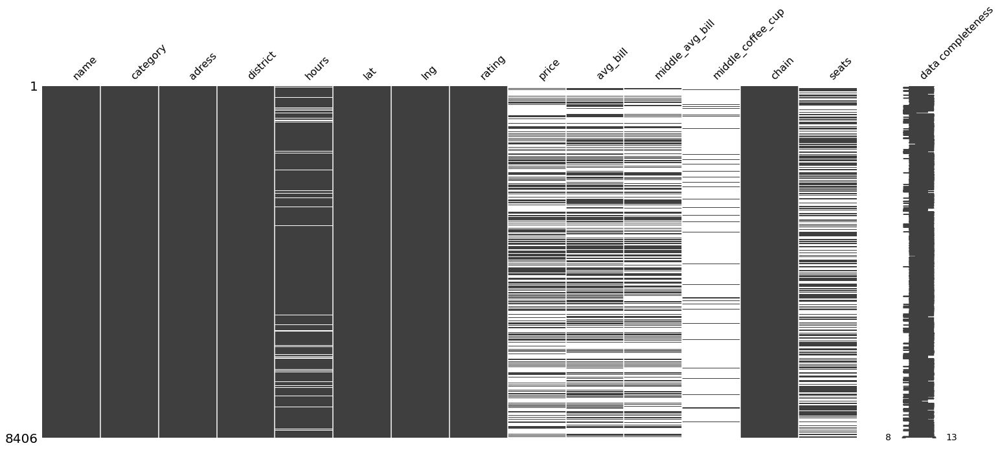

In [69]:
msno.matrix(data, labels = True);

В `hours` и `seats` нельзя заполнить качественно.
Аналогично с остальными колонками, количество пропусков достаточно высоко, поэтому не будем запонять их, можно исказить данные

### Создание дополнительных столбцов<a id="column_creation"></a>   

Создадим столбец `street` с названиями улиц 

In [70]:
tmp = data['adress'].str.split(', ')
data['street'] = tmp.apply(lambda x: x[1])
data.head()

,name,category,adress,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


Создадим столбец `is_24/7` с обозначением True, если заведение работает ежедневно и круглосуточно

In [71]:
data['is_24/7'] = data['hours'].apply(lambda x: x == 'ежедневно, круглосуточно')
data.head()

,name,category,adress,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


Сделано:
- Заменено название столбца с address на adress
- Дубликатов не обнаружено
- В данных есть пропуски, но качественно их заменить нельзя
- добавлены дополниельные колонки `street` - с названиями улиц и `is_24/7` - со значением `True` (если ресторан работает ежедневно и круглосуточно) и значением `False`(в ином случае)

## Анализ данных<a id="data_analysis"></a>   

### Категории заведений

Выведем ещё раз категории заведений c их количеством

In [72]:
number_of_est = data.groupby(by='category', as_index = False).agg({'adress':'count'}).sort_values(by = 'adress', ascending = False).reset_index(drop = True)
number_of_est = number_of_est.rename(columns={'adress':'quantity'})
number_of_est['percent'] = round(number_of_est['quantity']*100/data.shape[0], 2)
display(number_of_est)


fig = go.Figure(data=[go.Pie(labels=number_of_est['category'], values=number_of_est['quantity'])])
fig.update_layout(title='Доля категории')
fig.show()

,category,quantity,percent
0,кафе,2378,28.29
1,ресторан,2043,24.30
2,кофейня,1413,16.81
3,"бар,паб",765,9.10
4,пиццерия,633,7.53
5,быстрое питание,603,7.17
6,столовая,315,3.75
7,булочная,256,3.05


Всего 8 типов заведений. При этом больше всего кафе, ресторанов и кофеен, меньше всего - булочных и столовых. Посмотрим на это с точки зрения столбчатой диаграммы

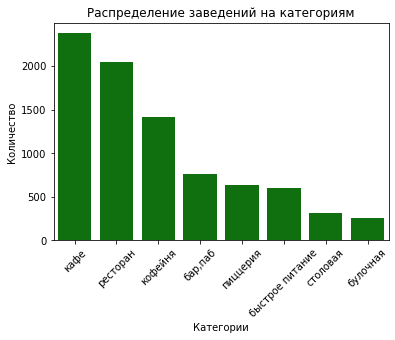

In [73]:
sns.barplot(x='category', y='quantity', data=number_of_est, color = "g")

plt.title('Распределение заведений на категориям')
plt.xlabel('Категории')
plt.ylabel('Количество')
plt.xticks(rotation=45);

Выводы аналогичны

### Посадочные места<a id="seats"></a>   

Построим boxplot для посадочных мест в зависимости от категории.

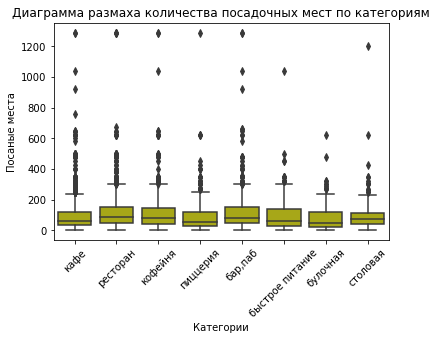

In [74]:
sns.boxplot(x='category', y='seats', data=data, color = "y")
plt.title('Диаграмма размаха количества посадочных мест по категориям')
plt.xlabel('Категории')
plt.ylabel('Посаные места')
plt.xticks(rotation=45);

Видно, что в данных достаточно много аномальных значений, посчитаем медиану для каждой категории

In [75]:
data.groupby(by = 'category', as_index = False).agg({'seats': 'median'}).sort_values(by = 'seats', ascending = False)

,category,seats
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


Между средним и медианой достаточно болшая разница из-за аномальных значений, поэтому для получения правдоподобной информации лучше смотреть на медиану. Таким образом, больше всего посадочных мест в ресторанах, барах/пабах и кофейнях

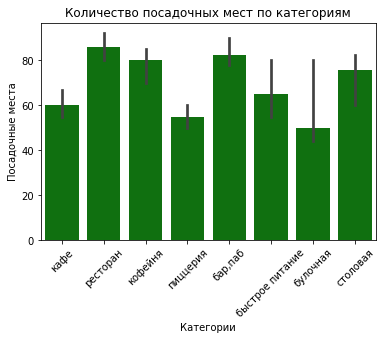

In [76]:
ax = sns.barplot(x='category', y='seats', data=data, estimator=median, color ="g")
plt.title('Количество посадочных мест по категориям')
plt.xlabel('Категории')
plt.ylabel('Посадочные места')
plt.xticks(rotation=45);

Больше всего аномальных значений в ресторанах быстрого питания и булочных

### Сетевые заведения<a id="chains"></a>   

Как было замечено ранее, в датасете есть сетевые и несетевые заведения. Посчитаем их количество.

In [77]:
number_of_house = data.groupby(['category', 'name'], as_index = False).agg({'adress':'nunique'})
chains = number_of_house.query('adress>1')
chains_number = chains.groupby('category', as_index = False).agg({'adress':'count'})

chains_number = chains_number.rename(columns={'adress':'chain'})
non_chains_number = number_of_house.query('adress==1').groupby('category', as_index = False).agg({'adress':'count'}).reset_index(drop = True)
chains_number['non-chain'] = non_chains_number['adress']
chains_number['percent_of_chain'] = round(chains_number['chain']*100/(chains_number['non-chain']+chains_number['chain']), 2)
chains_number.sort_values(by = 'chain', ascending = False)

,category,chain,non-chain,percent_of_chain
3,кафе,174,1586,9.89
6,ресторан,116,1434,7.48
4,кофейня,104,735,12.40
2,быстрое питание,52,402,11.45
0,"бар,паб",36,647,5.27
5,пиццерия,36,331,9.81
7,столовая,30,216,12.20
1,булочная,18,122,12.86


<Figure size 1440x432 with 0 Axes>

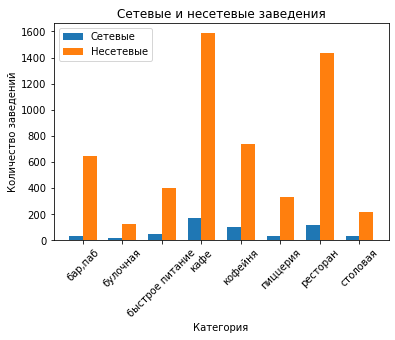

In [78]:
x = np.arange(len(chains_number))  # the label locations
width = 0.35

plt.figure(figsize=(20, 6))
fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, chains_number['chain'], width, label='Сетевые')
rects2 = ax.bar(x + width/2, chains_number['non-chain'], width, label='Несетевые')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Количество заведений')
ax.set_xlabel('Категория')
ax.set_title('Сетевые и несетевые заведения')
ax.set_xticks(x)
ax.set_xticklabels(chains_number['category'])
plt.xticks(rotation=45)
ax.legend();

Больше всего в абсолютном выражении сетей в кафе, ресторанах и кофейнях. Однако в процентном соотношении больше всего сетей - жто столовые, булочные и кофейни

Найдем топ-15 популярных сетей в Москве

In [79]:
top_15 = chains.sort_values(by = 'adress', ascending = False).reset_index(drop=True).head(15)
top_15

,category,name,adress
0,кафе,Кафе,159
1,кофейня,Шоколадница,119
2,пиццерия,Домино'с Пицца,76
3,пиццерия,Додо Пицца,74
4,кофейня,One Price Coffee,71
5,ресторан,Яндекс Лавка,69
6,кофейня,Cofix,65
7,ресторан,Prime,49
8,кофейня,КОФЕПОРТ,42
9,кафе,Кулинарная лавка братьев Караваевых,39


кафе "Кафе" смотрится странно. Информации о них нет в интренете. Сомневаюсь в его существовании, поэтому удалим это из датасета 

In [80]:
top_15 = chains.query('name != "Кафе"').sort_values(by = 'adress', ascending = False).reset_index(drop=True)
top_15 = top_15.head(15)
top_15

,category,name,adress
0,кофейня,Шоколадница,119
1,пиццерия,Домино'с Пицца,76
2,пиццерия,Додо Пицца,74
3,кофейня,One Price Coffee,71
4,ресторан,Яндекс Лавка,69
5,кофейня,Cofix,65
6,ресторан,Prime,49
7,кофейня,КОФЕПОРТ,42
8,кафе,Кулинарная лавка братьев Караваевых,39
9,ресторан,Теремок,36


Посмотрим на самые популярные сетевые заведения на графике

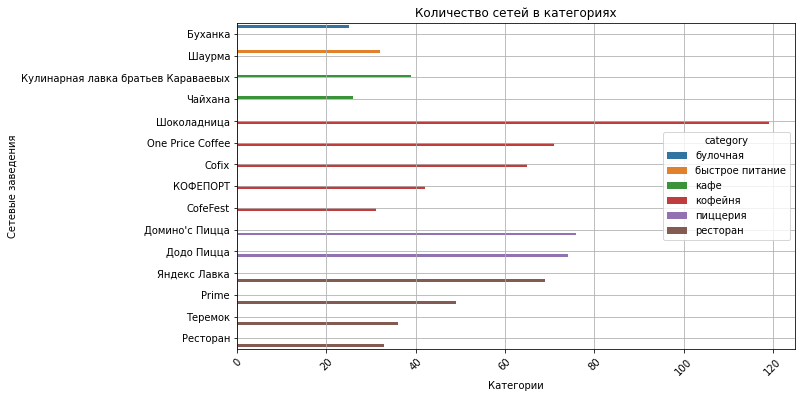

In [81]:
plt.figure(figsize=(10, 6))

sns.barplot(x='adress', y='name', data=top_15.sort_values(by = 'category'), hue='category')
plt.title('Количество сетей в категориях')
plt.xlabel('Категории')
plt.ylabel('Сетевые заведения')
plt.xticks(rotation=45)
plt.grid()
plt.show();

Теперь посмотрим на сети а разрезе округов.

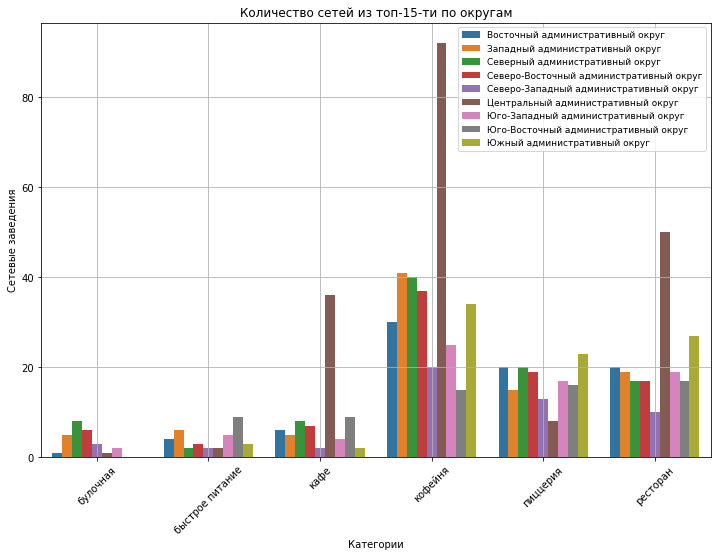

In [82]:
chain_names = list(top_15['name'])
distr_of_chain = data.query('name in @chain_names').groupby(by = ['category', 'district'], as_index = False).agg({'name':'count'})



plt.figure(figsize=(12, 8))

sns.barplot(x='category', y='name', data=distr_of_chain, hue='district')
plt.title('Количество сетей из топ-15-ти по округам')
plt.xlabel('Категории')
plt.ylabel('Сетевые заведения')
plt.xticks(rotation=45)
plt.legend(loc= 'upper right', fontsize=9)
plt.grid()
plt.show();

- Больше всего булочных в САО
- Ресторанов быстрого питания - в ЮВАО
- Кафе, кофеен и ресторанов - в ЦАО
- Пиццерий - в ЮАО

### Административные районы<a id="districts"></a>   

Обозначим административные округа датасета

In [83]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Как уже было выяснено, в датасете встречаются 9 одминистративных районов

In [84]:
f'Всего уникальных заведений в датасете {int(data.groupby("category").agg({"name":"nunique"}).sum())}'

'Всего уникальных заведений в датасете 6039'

In [85]:
districs = data.groupby("district", as_index = False).agg({"name":"count"}).sort_values(by = 'name', ascending = False)
districs['percent'] = round(districs['name']*100/int(data.groupby("category").agg({"name":"count"}).sum()), 2)
districs

,district,name,percent
5,Центральный административный округ,2242,26.67
2,Северный административный округ,900,10.71
8,Южный административный округ,892,10.61
3,Северо-Восточный административный округ,891,10.60
1,Западный административный округ,851,10.12
0,Восточный административный округ,798,9.49
6,Юго-Восточный административный округ,714,8.49
7,Юго-Западный административный округ,709,8.43
4,Северо-Западный административный округ,409,4.87


Больше всего заведений находится в центральном округе (26.7%), затем - примерно одинаковое количество в южном и северном и северо-восточном.

Визуализируем расспределение заведений по округам и категориям

In [86]:
districts_cat = data.groupby(["district", "category"], as_index = False).agg({"name":"count"}).sort_values(by = ['district', 'category'])

In [87]:
#plt.figure(figsize=(15, 13))

#sns.barplot(x='name', y='district', data= districts_cat, hue='category')
#plt.title('Количество заведений в округах по категориям')
#plt.xlabel('Количество заведений')
#plt.ylabel('Административный округ')
#plt.xticks(rotation=45)
#plt.grid()
#plt.show();

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'Центральный административный округ'),
  Text(1, 0, 'Северный административный округ'),
  Text(2, 0, 'Южный административный округ'),
  Text(3, 0, 'Северо-Восточный административный округ'),
  Text(4, 0, 'Западный административный округ'),
  Text(5, 0, 'Восточный административный округ'),
  Text(6, 0, 'Юго-Восточный административный округ'),
  Text(7, 0, 'Юго-Западный административный округ'),
  Text(8, 0, 'Северо-Западный административный округ')])

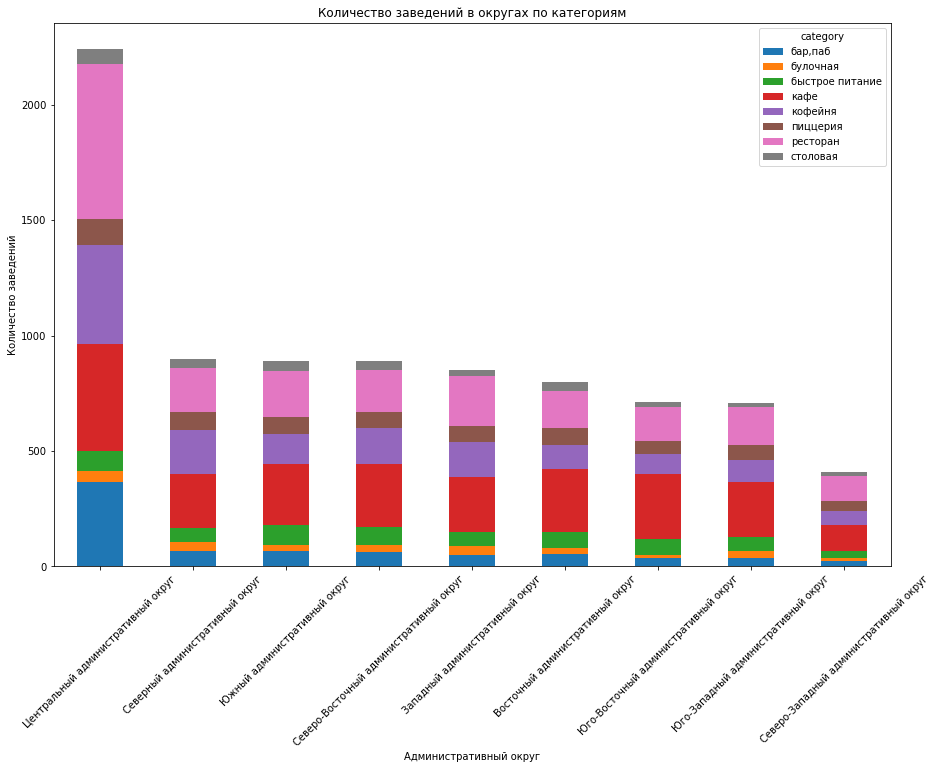

In [88]:
t = pd.pivot_table(districts_cat, index="district", columns="category", values= 'name')
t["sum"] = t.sum(axis = 1)
t = t.sort_values(by = "sum", ascending = False).drop(columns = ["sum"], axis = 1)
ax = t.plot.bar(figsize=(15, 10), title = 'Количество заведений в округах по категориям', stacked = True)
ax.set_xlabel('Административный округ')
ax.set_ylabel('Количество заведений')
plt.xticks(rotation=45)

Из графиков видно, что несмотря на большое количество заведений в целом в центральном округа, количество булочных, столовых и кафе быстрого питания приблизительно одинаковое в каждом округе.
СВАО выделяется на фоне остальных нецентральных округов - там меньше всего завдений (может быть тут как раз есть возможности)

Структура заведений в ЦАО отличается от остальных округов, там большая доля заведений - рестораны. В остальных же округах это кафе.

Кажется, что доля ресторанов и кафе в СЗAО практически одинакова, проверим это. Если всё верно, можно будет рассмотрети вариант постройки там кофейни

In [89]:
pie_data = data.query('district != "Центральный административный округ" and district != "Северо-Западный административный округ"').groupby('category', as_index = False).agg({'name':'count'})
pie_data
fig = go.Figure(data=[go.Pie(labels=pie_data['category'], values = pie_data['name'])])
fig.update_layout(title='Доля категорий во всей округах, кроме ЦАО и СЗАО')
fig.show()

In [90]:
pie_data = data.query('district == "Северо-Западный административный округ"').groupby('category', as_index = False).agg({'name':'count'})

fig = go.Figure(data=[go.Pie(labels=pie_data['category'], values = pie_data['name'])])
fig.update_layout(title='Доля категорий в СЗАО')
fig.show()

Таким образом, можно рассмотреть вариант кафе, пиццерии или столовой в СЗАО

### Средние рейтинги<a id="ratings"></a>   

Узнаем медиану и среднее рейтингов по категориям, а также построим ящик с усами

In [91]:
data.groupby('category').agg({'rating':['mean','median']})

rating       
                     mean median
category                        
бар,паб          4.387712    4.4
булочная         4.268359    4.3
быстрое питание  4.050249    4.2
кафе             4.123886    4.2
кофейня          4.277282    4.3
пиццерия         4.301264    4.3
ресторан         4.290357    4.3
столовая         4.211429    4.3

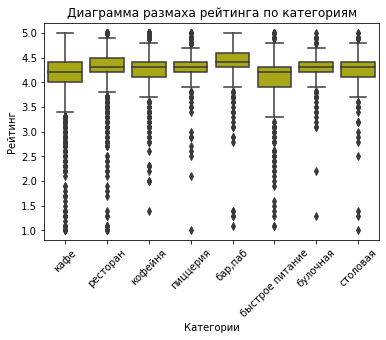

In [92]:
sns.boxplot(x='category', y='rating', data=data, color = "y")
plt.title('Диаграмма размаха рейтинга по категориям')
plt.xlabel('Категории')
plt.ylabel('Рейтинг')
plt.xticks(rotation=45);

Средние и медианные рейтинги не сильно отличаются в зависимости от категории, однако можно заметить, что в категориях `кафе`, `ресторан` и `быстрое питание` больше выбросов, чем в других категориях

In [93]:
rating_df = data.groupby('district', as_index=False)['rating'].agg('median')

In [94]:
# читаем файл и сохраняем в переменной
with open('C://Users//chame//Downloads//admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
    geo_json = json.load(f)

print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [95]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'C://Users//chame//Downloads//admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

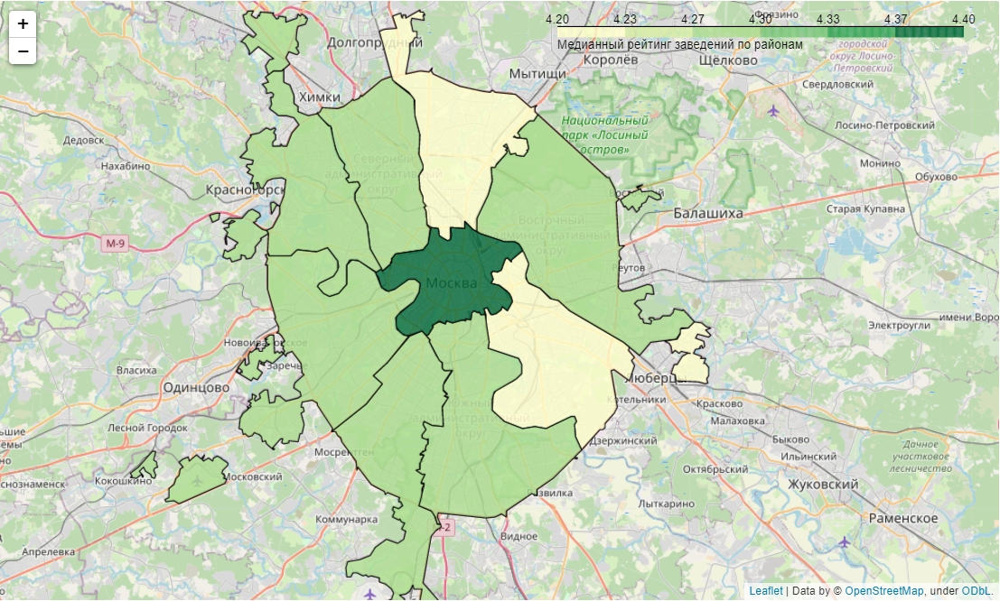

Самые высокие медианные райтинке у заведений в ЦАО, самиые низкие в ЮВАО и СВАО

### Самые популярные и непопулярные улицы<a id="streets"></a>   

Отобразим все заведения датасета с помощью кластеров

In [96]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Найдем топ-15 улиц с самым большим количеством заведений

In [97]:
popular_streets = data.groupby(['street', 'district'], as_index = False).agg({'name':'count'}).sort_values(by = 'name', ascending = False).reset_index(drop = True).head(15)
streets = list(popular_streets['street'])
popular_streets

,street,district,name
0,проспект Мира,Северо-Восточный административный округ,132
1,Профсоюзная улица,Юго-Западный административный округ,122
2,Ленинградский проспект,Северный административный округ,95
3,проспект Вернадского,Западный административный округ,95
4,Каширское шоссе,Южный административный округ,77
5,Варшавское шоссе,Южный административный округ,76
6,Ленинградское шоссе,Северный административный округ,70
7,Ленинский проспект,Юго-Западный административный округ,66
8,Дмитровское шоссе,Северный административный округ,65
9,Люблинская улица,Юго-Восточный административный округ,60


In [98]:
pop_str_data = data.query('street in @streets')
pop_str_data_grouped = pop_str_data.groupby(['street', 'category'], as_index = False).agg({'name':'count'}).sort_values(by = ['street', 'category'])
pivot_pop_str_data = pd.pivot_table(pop_str_data_grouped, index="street", columns="category", values= 'name').fillna(0)
pivot_pop_str_data["sum"] = pivot_pop_str_data.sum(axis = 1)
pivot_pop_str_data = pivot_pop_str_data.sort_values(by = "sum", ascending = False).drop(columns = ["sum"], axis = 1)
pivot_pop_str_data

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
проспект Мира,12.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0
Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0
проспект Вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
Каширское шоссе,2.0,0.0,10.0,20.0,16.0,5.0,19.0,5.0
Варшавское шоссе,6.0,0.0,7.0,18.0,14.0,4.0,20.0,7.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0


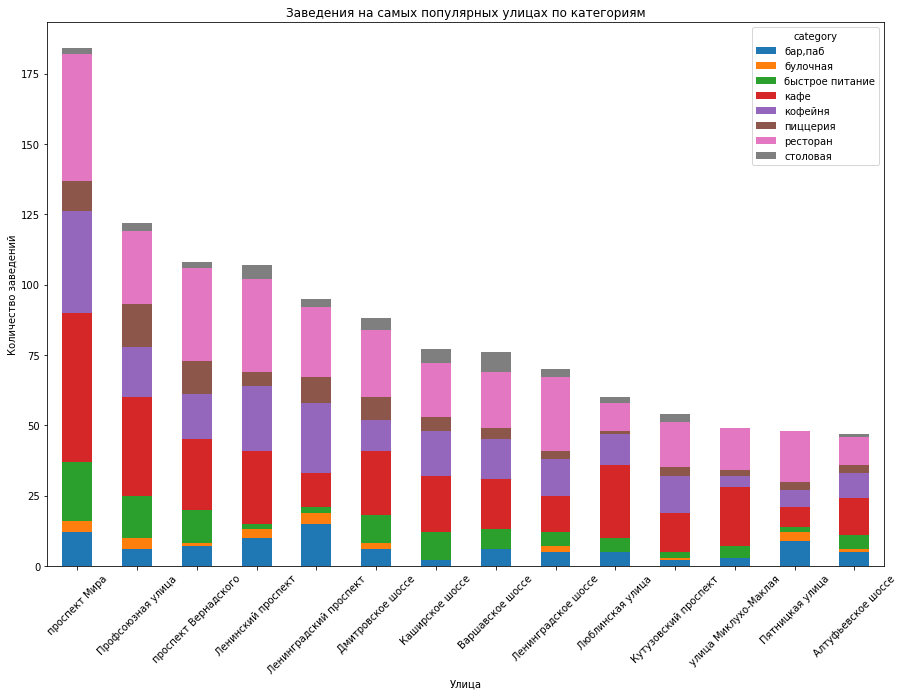

In [99]:
ax = pivot_pop_str_data.plot.bar(figsize=(15, 10), title = 'Заведения на самых популярных улицах по категориям', stacked = True)
ax.set_xlabel('Улица')
ax.set_ylabel('Количество заведений')
plt.xticks(rotation=45);

Видно, что на некоторых улицах определенные категории отсутствуют в принципе. Например, на Варшавском шоссе совсем нет булочных, как и на Каширском шоссе, Люблинской улице и улица Миклухо-Маклая. На последней также нет столовых, как и на Пятницкой улице.

- Баров больше всего на Ленинградском проспекте,
- Булочных - на Ленинградском проспекте, Профсоюзной улице и проспекте Мира,
- Ресторанов быстрого питания - на проспекте Мира
- Кафе - на Проспекте Мира 
- Кофеен - также на Проспекте Мира
- Пиццерий - на Профсоюзной улице
- Ресторанов - на Проспекте Мира
- Столовых - на Варшавском шоссе

Посмотрим, на каких улицах расположено только одно заведение

In [100]:
unpop_streets = data.groupby(['street', 'district'], as_index = False).agg({'name':'count'}).query('name==1')
unpop_streets.groupby('district', as_index = False).agg({'name':'count'}).sort_values('name', ascending = False)

,district,name
5,Центральный административный округ,148
3,Северо-Восточный административный округ,56
2,Северный административный округ,53
0,Восточный административный округ,52
8,Южный административный округ,50
6,Юго-Восточный административный округ,42
1,Западный административный округ,36
4,Северо-Западный административный округ,21
7,Юго-Западный административный округ,18


In [101]:
sing_street = list(unpop_streets['street'])
data.query('street in @sing_street').groupby('category').agg({'name':'count', 'rating':'median', 'middle_avg_bill':'median', 'seats':'median'})

,name,rating,middle_avg_bill,seats
category,,,,
"бар,паб",55,4.40,1250.0,61.5
булочная,14,4.35,1000.0,36.0
быстрое питание,41,4.30,437.5,42.5
кафе,258,4.20,500.0,50.0
кофейня,107,4.30,550.0,51.5
пиццерия,25,4.30,600.0,39.0
ресторан,137,4.30,1250.0,90.0
столовая,45,4.30,285.0,80.0


Данные не выглядят необычно, медианный рейтин примерно совпадает с общеми рейтингами, бросается в глаза медиана по среднему чеку в булочной. Но это, скорее всего, из-за малого количества данных. Проверим

In [102]:
data.query('street in @sing_street and category == "булочная"')

,name,category,adress,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
177,Арамье,булочная,"Москва, улица 800-летия Москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.879392,37.556832,4.0,NaN,NaN,NaN,NaN,1,0.0,улица 800-летия Москвы,False
1972,Буханка,булочная,"Москва, улица Полины Осипенко, 10, корп. 1",Северный административный округ,"ежедневно, 07:00–23:00",55.780418,37.534420,4.7,NaN,NaN,NaN,NaN,1,10.0,улица Полины Осипенко,False
2311,Скалка,булочная,"Москва, Трифоновская улица, 56",Центральный административный округ,"ежедневно, 08:00–21:30",55.789615,37.632046,4.3,NaN,NaN,NaN,NaN,1,NaN,Трифоновская улица,False
3259,Plov Time,булочная,"Москва, улица Пивченкова, 7",Западный административный округ,"ежедневно, 09:00–22:00",55.735520,37.475576,4.4,NaN,NaN,NaN,NaN,0,12.0,улица Пивченкова,False
4113,Remy Kitchen Bakery,булочная,"Москва, Пресненская набережная, 8, стр. 1",Центральный административный округ,"ежедневно, 08:00–00:00",55.746841,37.538648,4.4,средние,Средний счёт:500–1500 ₽,1000.0,NaN,1,478.0,Пресненская набережная,False
4387,Осетинские пироги Pir & Rog,булочная,"Москва, Дурасовский переулок, 1, стр. 1",Центральный административный округ,"ежедневно, 10:00–20:00",55.755039,37.648942,4.9,NaN,NaN,NaN,NaN,0,NaN,Дурасовский переулок,False
4649,Барави,булочная,"Москва, Мясницкий проезд, 2/1",Центральный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–20:00",55.767964,37.646427,4.3,NaN,NaN,NaN,NaN,0,36.0,Мясницкий проезд,False
5832,Пекарня Буханка,булочная,"Москва, 2-й переулок Петра Алексеева, 5",Западный административный округ,"ежедневно, 09:00–20:00",55.717888,37.429627,4.5,NaN,NaN,NaN,NaN,1,NaN,2-й переулок Петра Алексеева,False
6350,Любовь Пирогова,булочная,"Москва, Мытная улица, 74",Южный административный округ,"ежедневно, 08:00–21:00",55.712117,37.620555,5.0,NaN,Средний счёт:250–500 ₽,375.0,NaN,0,92.0,Мытная улица,False
6855,Сам пришёл,булочная,"Москва, Севастопольский проспект, 28, корп. 2",Юго-Западный административный округ,"ежедневно, 12:00–00:00",55.664394,37.578403,4.4,выше среднего,Средний счёт:1200 ₽,1200.0,NaN,1,88.0,Севастопольский проспект,False


Дейсвительно, из 14 булочных только для трех есть средний чек, причем у двух из них средний чек крайне высок для такого типа заведений

### Средний чек<a id="receipt"></a>   

Рассчитаем средний чек для каждой категории заведений.

In [103]:
data.groupby('category').agg({'middle_avg_bill':['mean', 'median']})

middle_avg_bill        
                           mean  median
category                               
бар,паб             1338.762178  1250.0
булочная             658.773585   450.0
быстрое питание      445.763713   375.0
кафе                 707.753602   550.0
кофейня              614.210000   400.0
пиццерия             789.377215   600.0
ресторан            1367.881731  1250.0
столовая             335.348066   300.0

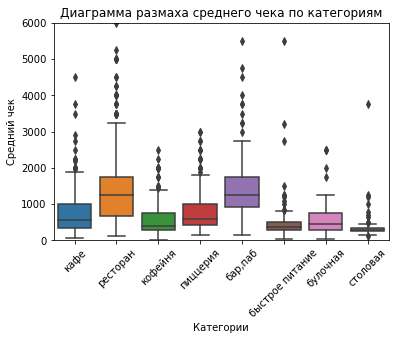

In [104]:
sns.boxplot(x='category', y='middle_avg_bill', data=data)
plt.ylim(0, 6000)
plt.title('Диаграмма размаха среднего чека по категориям')
plt.xlabel('Категории')
plt.ylabel('Средний чек')
plt.xticks(rotation=45);

Видно, что в категориях `кафе`, `бар`, `кофейня` и `пиццерия` Q3 находится дальше от медианы, чем Q1 - то есть достаточно много выдающихся значений.

Средний чек, ожидаемо, выше в ресторанах и барах, а ниже всего в столовых и булочных


Посмотрим на средний чек заведений по районам и в разрезе категорий

In [105]:
k = data.groupby(['district', 'category'], as_index = False).agg({'middle_avg_bill':'median'}).sort_values(by = 'district', ascending = False)

In [106]:
middle_bill_df = data.groupby('district', as_index = False).agg({'middle_avg_bill':'median'})

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_bill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

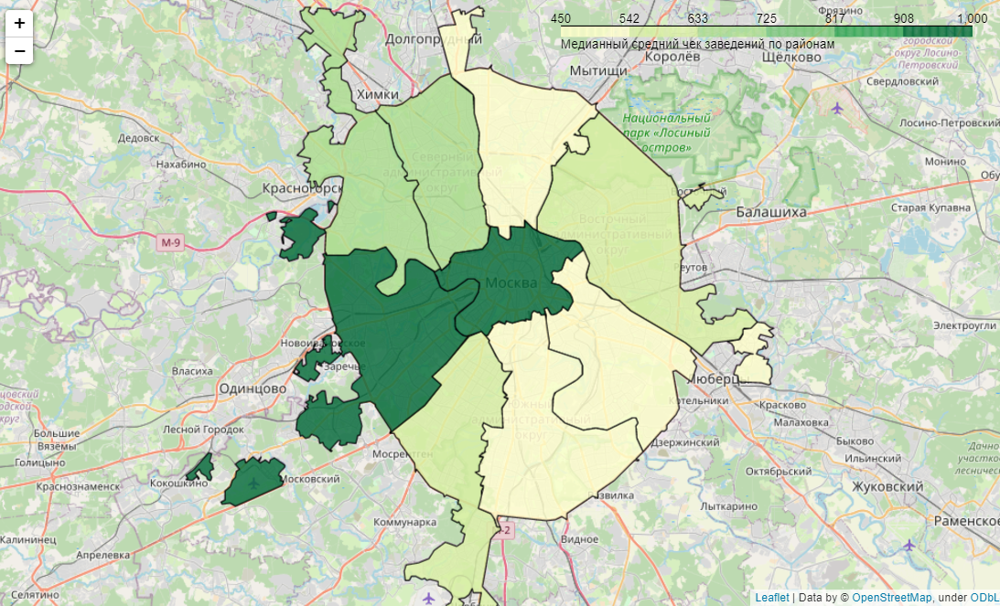

Наибольший медианный средний чек в центральном и западном административном округах, наименьший - в юго-восточном округе

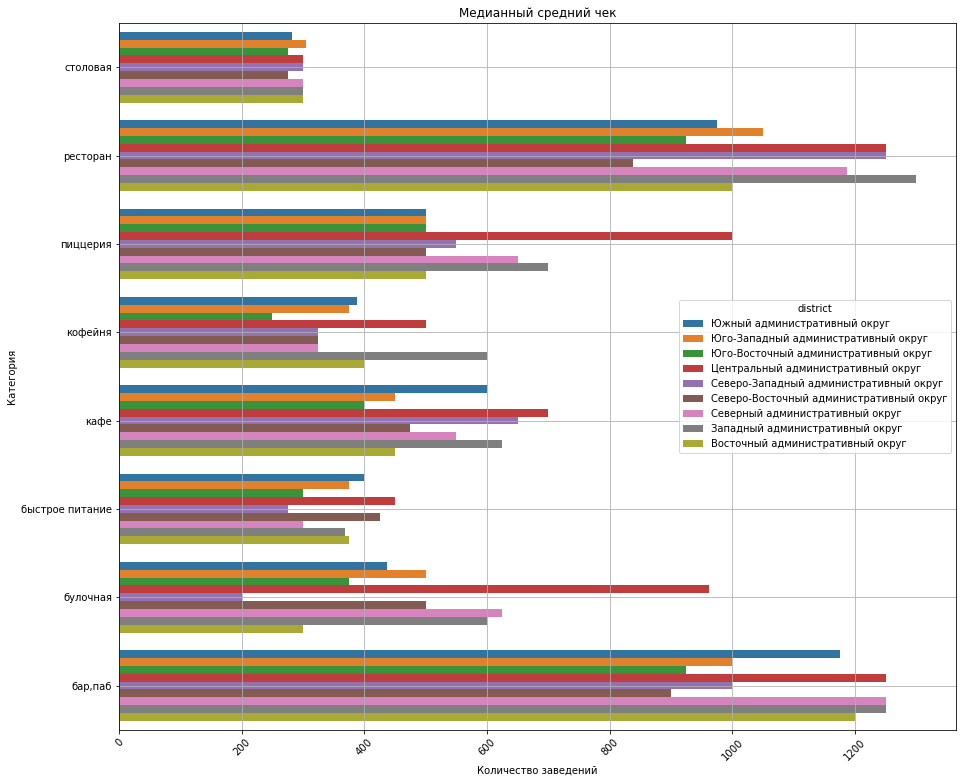

In [107]:
plt.figure(figsize=(15, 13))

sns.barplot(x='middle_avg_bill', y='category', data= k, hue='district')
plt.title('Медианный средний чек')
plt.xlabel('Количество заведений')
plt.ylabel('Категория')
plt.xticks(rotation=45)
plt.grid()
plt.show();

Средний чек столовых практически одинаков во всех категориях.

Сильно выбиваются из своих категорий медианные цены в ресторанах в СВАО, кофейнях в ЮВАО, булочных в СЗАО и баров в СВАО (в меньшую сторону)

**Вывод:**
- Самая распространенная категория заведений – кафе, самая малочисленная – булочные
- Больше всего посадочных мест в ресторанах, меньше всего – в булочных
- Во всех категориях превалируют несетевые заведения
- Больше всего заведений всего – в ЦАО (28.4%), при этом в этом округе много баров и ресторанов. Меньше всего заведений – в СЗАО
- Заведения с самым высоким медианным рейтингом – в ЦАО. С самым низким – в СВАО, и ЮВАО
- Наибольший медианный средний чек в центральном и западном административном округах, наименьший - в юго-восточном округе

Можно рассмотреть вариант открытия кафе или ресторана быстрого питания в СЗАО:
- Доли этих заведений в округе ниже соответствующих долей в остальных нецентральных районах
- Достаточно высокий средний чек во всех вышеперечисленных категориях по сравнению с другими округами

## Детализация исследование: открытие кофейни<a id="detalisation"></a>   

Узнаем, сколько всего в датасете кофеен

In [108]:
coffeehouse = data.query('category == "кофейня"')
coffeehouse.shape[0]

1413

Всего кофеен 1413 по Москве. Проанализируем кофейни по административным округам

In [109]:
coffeehouse.groupby('district', as_index = False).agg({'name':'count', 'middle_coffee_cup':'median', 'seats':'median', 'chain':'sum', 'rating':'median', 'is_24/7':'sum'}).sort_values(by='name', ascending = False)

,district,name,middle_coffee_cup,seats,chain,rating,is_24/7
5,Центральный административный округ,428,190.0,86.0,221,4.3,26
2,Северный административный округ,193,159.0,66.0,97,4.3,5
3,Северо-Восточный административный округ,159,162.5,75.0,79,4.3,3
1,Западный административный округ,150,189.0,96.0,93,4.2,9
8,Южный административный округ,131,150.0,80.0,66,4.3,1
0,Восточный административный округ,105,135.0,55.0,51,4.3,5
7,Юго-Западный административный округ,96,198.0,64.5,50,4.3,7
6,Юго-Восточный административный округ,89,147.5,50.0,29,4.3,1
4,Северо-Западный административный округ,62,165.0,87.5,34,4.3,2


Больше Всчего кофеен в Центральном, Северном и Северно-Восточном округах. При этом средняя стоимость чашки кофе выше всего в ЮЗАО, ЦАО и ЗАО.

Кроме того, более половины кофеен в ЦАО, ЗАО, ЮАО и ЮЗАО - сети

Медианный рейтинг примерно одинаков во всех округах

Также кофейни в основном не работают ежедневно и круглосуточно, но больше всего таких кофеен в ЦАО, затем - ЗАО и ЮЗАО

**Необходимо оприделиться с требованиями** - конкуренция не важно, доступная - значет средний чек может быть невысоким (средним), как и количество посадочных мест. Посмотрим на расположение несетевых кафе, рядом с которыми, скорее всего, не стоит открывать своё заведение.

Рассмотрим несетевые заведения

In [110]:
coffeehouse_unique = coffeehouse.query('chain == 0')
coffeehouse_unique_grouped = coffeehouse_unique.groupby('district', as_index = False).agg({'name':'count', 'middle_coffee_cup':'median', 'seats':'median', 'rating':'median', 'is_24/7':'sum'}).sort_values(by='name', ascending = False)
coffeehouse_unique_grouped

,district,name,middle_coffee_cup,seats,rating,is_24/7
5,Центральный административный округ,207,195.0,50.0,4.40,6
2,Северный административный округ,96,165.0,70.0,4.40,0
3,Северо-Восточный административный округ,80,162.5,52.0,4.35,0
8,Южный административный округ,65,170.0,80.0,4.40,0
6,Юго-Восточный административный округ,60,150.0,54.0,4.35,0
1,Западный административный округ,57,170.0,98.0,4.30,1
0,Восточный административный округ,54,135.0,52.0,4.40,0
7,Юго-Западный административный округ,46,190.5,50.0,4.40,2
4,Северо-Западный административный округ,28,165.0,25.5,4.45,0


В сетевых кофейнях цены в большинстве случаев ниже, чем в кофейнях - одиночках, посмотрим на средний чек и медиану в несетевых кофейнях

In [111]:
coffeehouse_unique['middle_coffee_cup'].mean(), coffeehouse_unique['middle_coffee_cup'].median()

(177.30038022813687, 170.0)

Будем ориентироваться на значение 170 рублей за чашку кофе - вполне доступная цена.

In [112]:
coffeehouse_unique['seats'].mean(), coffeehouse_unique['seats'].median()

(98.97076023391813, 60.0)

Также можно посмотреть на медианный рейтинг кофеен в округе. Чем он ниже, тем выше вероятность, что в наша кофейня привлечет внимание.

Визуализируем хороплет по количеству кофеен

In [113]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffeehouse_unique_grouped,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен по административным округам',
).add_to(m)

# выводим карту
m

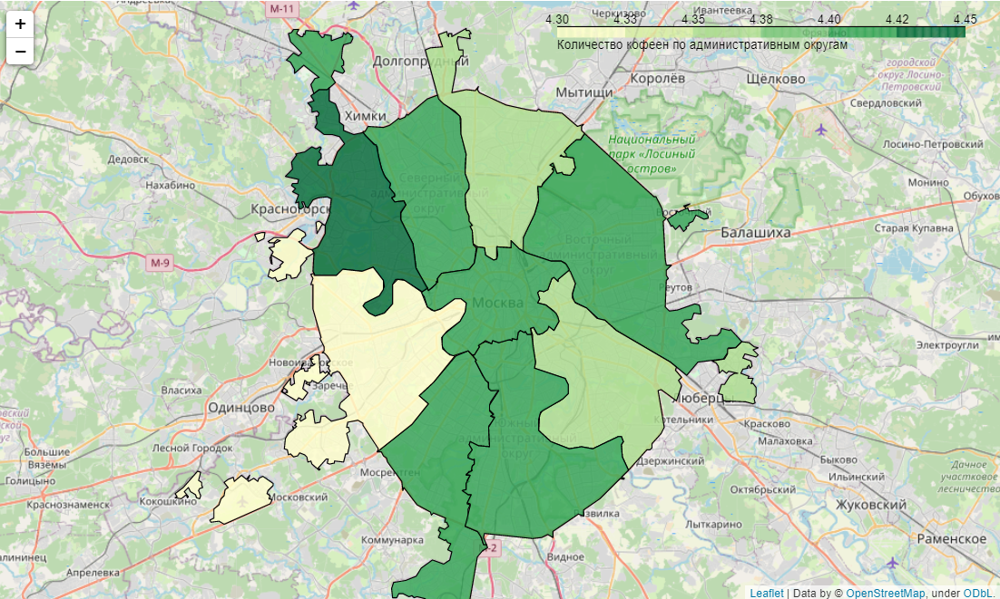

Западный административный округ, Юго-Восточный административный округ и Северо-Восточный административный округ выделяются на общем фоне

In [114]:
coffeehouse_unique.query('district == "Западный административный округ" or district == "Юго-Восточный административный округ" or district == "Северо-Восточный административный округ" or district == "Восточный административный округ"').groupby('district', as_index = False).agg({'middle_coffee_cup':'median'}).sort_values(by = 'middle_coffee_cup')

,district,middle_coffee_cup
0,Восточный административный округ,135.0
3,Юго-Восточный административный округ,150.0
2,Северо-Восточный административный округ,162.5
1,Западный административный округ,170.0


Цена за кофе 170 рублей выше, чем во всех административных округах, кроме Западного административного округа. Также в ЗАО медианный чек по всем кофейням равен 189, что дает преимущество над сетевыми кофейнями

Можно Расставить точки с кофейнями на карте и посмотреть, где лучше всего расположить нашу кофейню.

In [115]:
# сохраняем координаты Большого театра в переменные
bolshoi_theatre_lat, bolshoi_theatre_lng = 55.760082, 37.618668
# создаём карту с центром в точке расположения Большого театра и начальным зумом 17
m = folium.Map(location=[bolshoi_theatre_lat, bolshoi_theatre_lng], zoom_start=10)
# создаём маркер в точке расположения Большого театра и сразу добавляем на карту
folium.Marker([bolshoi_theatre_lat, bolshoi_theatre_lng]).add_to(m)
# создаём маркер в точке расположения Малого театра и сразу добавляем на карту

west_adm_dist = coffeehouse.query('district == "Западный административный округ"')
lats = list(west_adm_dist['lat'])
lngs = list(west_adm_dist['lng'])

for i in range(len(west_adm_dist)):
    lat = lats[i]
    lng = lngs[i]
    folium.Marker([lat, lng]).add_to(m)

# выводим карту
m

Лучше всего рассматривать точки, близкие к паркам, метро/вокзалам, жилым комплексам и университетам.

Таким образом, можно дать следующие рекомендации.
- Расположение: ЗАО
- Цена за чашку кофе: 170р
- Количество посадочных мест: 60

## Выводы <a id="conclusion"></a>   

Презентация: <https://disk.yandex.ru/i/5YzYIzwvSaQRLg>